# R(2+1)D Model Fine-tuning on HMDB51  

In this notebook, we show how to finetune the pretrained R(2+1)D model. We use [HMDB51](http://serre-lab.clps.brown.edu/resource/hmdb-a-large-human-motion-database/) human action dataset for this example.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import time
import sys

import numpy as np
from sklearn.metrics import accuracy_score
import torch
import torch.cuda as cuda
import torch.nn as nn
import torchvision

from vu.data import show_batch, VideoDataset
from vu.models.r2plus1d import R2Plus1D 
from vu.utils import system_info

system_info()

3.6.8 |Anaconda, Inc.| (default, Dec 30 2018, 01:22:34) 
[GCC 7.3.0] 

PyTorch 1.3.1 

Torch-vision 0.4.2 

Available devices:
0: Tesla P100-PCIE-16GB
1: Tesla P100-PCIE-16GB
2: Tesla P100-PCIE-16GB
3: Tesla P100-PCIE-16GB


### Prerequisites
* Download and extract HMDB51 videos under `./data/hmdb51/videos` directory. 

In [3]:
DATA_ROOT = os.path.join("data", "hmdb51")
VIDEO_DIR = os.path.join(DATA_ROOT, "videos")
# This split is known as "split1"
TRAIN_SPLIT = os.path.join(DATA_ROOT, "hmdb51_vid_train_split_1.txt")
TEST_SPLIT = os.path.join(DATA_ROOT, "hmdb51_vid_val_split_1.txt")

## Model and Training Configurations

In [4]:
# 8-frame or 32-frame models
MODEL_INPUT_SIZE = 32
# 16 for 8-frame model.
BATCH_SIZE = 8

# Model configuration
r2plus1d_hmdb51_cfgs = dict(
    # HMDB51 dataset spec
    num_classes=51,
    video_dir=VIDEO_DIR,
    train_split=TRAIN_SPLIT,
    valid_split=TEST_SPLIT,
    # Pre-trained model spec ("Closer look" and "Large-scale" papers)
    base_model='ig65m',
    sample_length=MODEL_INPUT_SIZE,     
    sample_step=1,        # Frame sampling step
    im_scale=128,         # After scaling, the frames will be cropped to (112 x 112)
    mean=(0.43216, 0.394666, 0.37645),
    std=(0.22803, 0.22145, 0.216989),
    random_shift=True,
    temporal_jitter_step=2,    # Temporal jitter step in frames (only for training set)
    flip_ratio=0.5,
    random_crop=True,
    video_ext='avi',
)

# Training configuration
train_cfgs = dict(
    mixed_prec=False,
    batch_size=BATCH_SIZE,
    grad_steps=2,
    lr=0.001,         # 0.001 ("Closer look" paper, HMDB51)
    momentum=0.95,
    warmup_pct=0.3,  # First 30% of the steps will be used for warming-up
    lr_decay_factor=0.001,
    weight_decay=0.0001,
    epochs=48,
    model_name='hmdb51',
    model_dir=os.path.join("checkpoints", "ig65m_kinetics"),
)

## Load Model and Data

Load R(2+1)D 34-layer model pre-trained on IG65M. There are two versions of the model: 8-frame model and 32-frame model based on the input clip length.

In [5]:
learn = R2Plus1D(r2plus1d_hmdb51_cfgs)

Loading r2plus1d_34_32_ig65m model


Using cache found in /home/jumin/.cache/torch/hub/moabitcoin_ig65m-pytorch_master


Model structure

In [6]:
learn.model

VideoResNet(
  (stem): R2Plus1dStem(
    (0): Conv3d(3, 45, kernel_size=(1, 7, 7), stride=(1, 2, 2), padding=(0, 3, 3), bias=False)
    (1): BatchNorm3d(45, eps=0.001, momentum=0.9, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv3d(45, 64, kernel_size=(3, 1, 1), stride=(1, 1, 1), padding=(1, 0, 0), bias=False)
    (4): BatchNorm3d(64, eps=0.001, momentum=0.9, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Sequential(
        (0): Conv2Plus1D(
          (0): Conv3d(64, 144, kernel_size=(1, 3, 3), stride=(1, 1, 1), padding=(0, 1, 1), bias=False)
          (1): BatchNorm3d(144, eps=0.001, momentum=0.9, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv3d(144, 64, kernel_size=(3, 1, 1), stride=(1, 1, 1), padding=(1, 0, 0), bias=False)
        )
        (1): BatchNorm3d(64, eps=0.001, momentum=0.9, affine=True, track_running_stats=Tru

Three examples of training (transformed) clips. 

/data/anaconda/envs/r2p1d/lib/python3.6/site-packages/torch/nn/functional.py:2494: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


<Figure size 432x288 with 0 Axes>

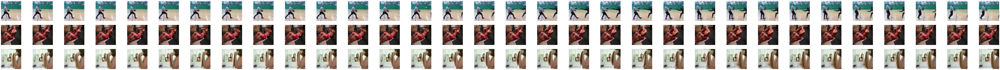

In [7]:
learn.show_batch(num_samples=3)

<Figure size 432x288 with 0 Axes>

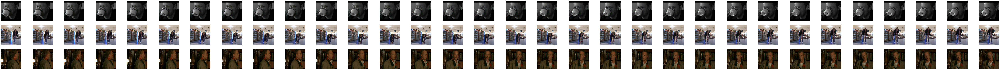

In [8]:
learn.show_batch(which_data='valid', num_samples=3)

## Fine-tuning

In [9]:
learn.fit(train_cfgs)

Params to learn:
	full network
Epoch 1 ==========
lr=[3.9999999999999996e-05]
train took 456.71 sec: loss = 3.9762, top1_acc = 2.9692, top5_acc = 12.0728
valid took 155.61 sec: loss = 3.9238, top1_acc = 3.3333, top5_acc = 16.4706
Epoch 2 ==========
lr=[5.313140544408986e-05]
train took 427.50 sec: loss = 3.8571, top1_acc = 6.9188, top5_acc = 20.2521
valid took 154.65 sec: loss = 3.7619, top1_acc = 11.8301, top5_acc = 24.1830
Epoch 3 ==========
lr=[9.180714757245454e-05]
train took 430.89 sec: loss = 3.6658, top1_acc = 18.2633, top5_acc = 37.1148
valid took 151.02 sec: loss = 3.4335, top1_acc = 22.4837, top5_acc = 46.7320
Epoch 4 ==========
lr=[0.00015391111450701667]
train took 432.72 sec: loss = 3.3525, top1_acc = 33.3053, top5_acc = 60.6162
valid took 152.20 sec: loss = 2.9711, top1_acc = 34.3137, top5_acc = 66.9281
Epoch 5 ==========
lr=[0.00023604533804150933]
train took 438.69 sec: loss = 2.9212, top1_acc = 46.7787, top5_acc = 77.1429
valid took 151.80 sec: loss = 2.3596, top1_acc

Epoch 42 ==========
lr=[7.667483486984251e-05]
train took 437.87 sec: loss = 0.0584, top1_acc = 99.4678, top5_acc = 99.9440
valid took 171.31 sec: loss = 0.9244, top1_acc = 78.8235, top5_acc = 95.2941
Epoch 43 ==========
lr=[5.3688749342379215e-05]
train took 433.43 sec: loss = 0.0566, top1_acc = 99.5518, top5_acc = 100.0000
valid took 154.34 sec: loss = 0.9888, top1_acc = 79.2157, top5_acc = 94.7059
Epoch 44 ==========
lr=[3.4601743152870814e-05]
train took 430.96 sec: loss = 0.0515, top1_acc = 99.4958, top5_acc = 99.9720
valid took 162.86 sec: loss = 1.0701, top1_acc = 78.6275, top5_acc = 93.0719
Epoch 45 ==========
lr=[1.9580557373889158e-05]
train took 442.48 sec: loss = 0.0513, top1_acc = 99.6359, top5_acc = 99.9440
valid took 151.82 sec: loss = 0.9733, top1_acc = 79.2157, top5_acc = 93.3987
Epoch 46 ==========
lr=[8.756414712820529e-06]
train took 437.71 sec: loss = 0.0489, top1_acc = 99.5798, top5_acc = 99.9720
valid took 151.32 sec: loss = 0.9726, top1_acc = 79.0850, top5_acc =

Each accuracy is averaged batch-wise accuracy.

## Model Test

Reported accuracy from "Closer look" paper: 74.5% (clip accuracy of 66.1% on split1 based on VMZ repo)

1. sample 10 clips uniformly sampled from each test video: [10 x 3 x 8 x 112 x 112]
2. calculate clip-level accuracy: Use 10 batch and infer
3. calculate video-level accuracy by averaging them
4. average over the clips

In [ ]:
# ### Load Saved Weights if needed
#learn.load(body_train_cfgs['model_name'] + "_032", body_train_cfgs['model_dir'])

In [10]:
if cuda.is_available():
    device = torch.device("cuda")
    num_gpus = cuda.device_count()
    # Look for the optimal set of algorithms to use in cudnn. Use this only with fixed-size inputs.
    torch.backends.cudnn.benchmark = True
else:
    device = torch.device("cpu")
    num_gpus = 0

In [11]:
# Uniformly sample 10 clips per videos ("Closer look" papers)
num_segments = 10
test_ds = VideoDataset(
    split_file=r2plus1d_hmdb51_cfgs['valid_split'],
    video_dir=r2plus1d_hmdb51_cfgs['video_dir'],
    num_segments=num_segments,
    sample_length=r2plus1d_hmdb51_cfgs['sample_length'],
    sample_step=1,
    input_size=112,
    im_scale=r2plus1d_hmdb51_cfgs['im_scale'],
    resize_keep_ratio=True,
    mean=r2plus1d_hmdb51_cfgs['mean'],
    std=r2plus1d_hmdb51_cfgs['std'],
    random_shift=False,
    temporal_jitter=False,
    flip_ratio=0.0,
    random_crop=False,
    random_crop_scales=None,
    video_ext=r2plus1d_hmdb51_cfgs['video_ext'],
)

In [12]:
print("{} samples of {}".format(len(test_ds), test_ds[0][0][0].shape))

1530 samples of torch.Size([3, 32, 112, 112])


<Figure size 432x288 with 0 Axes>

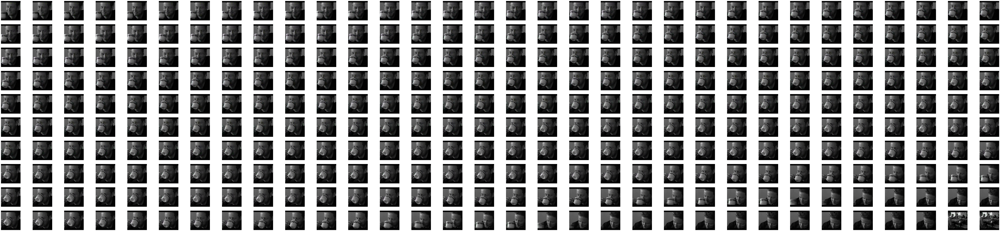

In [13]:
show_batch(
    test_ds[0][0],
    r2plus1d_hmdb51_cfgs['sample_length'],
    r2plus1d_hmdb51_cfgs['mean'],
    r2plus1d_hmdb51_cfgs['std']
)

In [14]:
model = learn.model
model.to(device)
if num_gpus > 1:
    model = nn.DataParallel(model)

model.eval()
infer_times = []
video_preds = []
video_trues = []
clip_preds = []
clip_trues = []

report_every = 100
with torch.no_grad():
    for i, (inputs, label) in enumerate(test_ds, start=1):
        if i % report_every == 0:
            print("{} samples have processed".format(i))
        
        inputs = inputs.to(device, non_blocking=True)
        
        start_time = time.time()
        outputs = model(inputs)
        infer_time = time.time() - start_time
        
        outputs = outputs.cpu().numpy()
        
        infer_times.append(infer_time)
        video_preds.append(outputs.sum(axis=0).argmax())
        video_trues.append(label)
        clip_preds.extend(outputs.argmax(axis=1))
        clip_trues.extend([label] * num_segments)
        
print("Done! {} samples have processed".format(len(test_ds)))

print("Avg. inference time per video (10 clips) =", np.array(infer_times).mean() * 1000, "ms")
print("Video prediction accuracy =", accuracy_score(video_trues, video_preds))
print("Clip prediction accuracy =", accuracy_score(clip_trues, clip_preds))

100 samples have processed
200 samples have processed
300 samples have processed
400 samples have processed
500 samples have processed
600 samples have processed
700 samples have processed
800 samples have processed
900 samples have processed
1000 samples have processed
1100 samples have processed
1200 samples have processed
1300 samples have processed
1400 samples have processed
1500 samples have processed
Done! 1530 samples have processed
Avg. inference time per video (10 clips) = 90.16439977035023 ms
Video prediction accuracy = 0.7980392156862746
Clip prediction accuracy = 0.771437908496732
